# Exercise 2 - Sigmoid Function

## Exercise 2 a)
Compute the derivative of the sigmoid function
σ(z) = 1/(1 + e**−z)

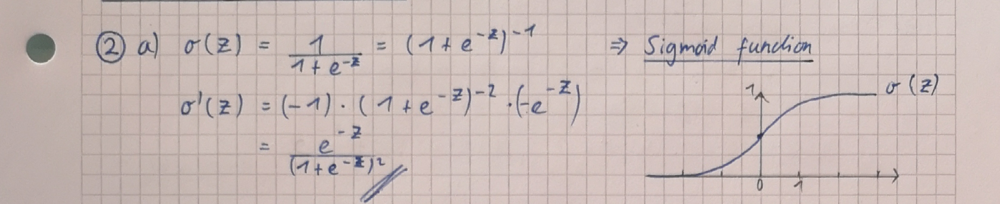

In [1]:
from PIL import Image

im = Image.open('images/exercise2_1.jpg')

width, height = im.size
im_disp = im.crop((0,200,width,680))

display(im_disp)

## Exercise 2 b)
Show that the derivative fullfills the equation
σ'(z) = σ(z) · (1 − σ(z))

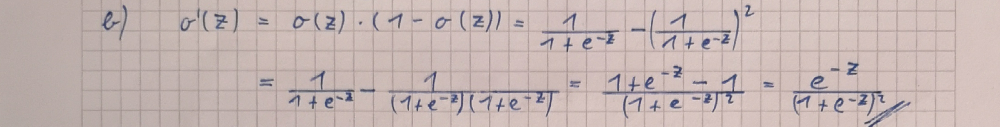

In [2]:
im_disp = im.crop((0,680,width,980))

display(im_disp)

## Exercise 2 c)
Compute the first and second derivative of ζ(z). Create a plot of ζ.

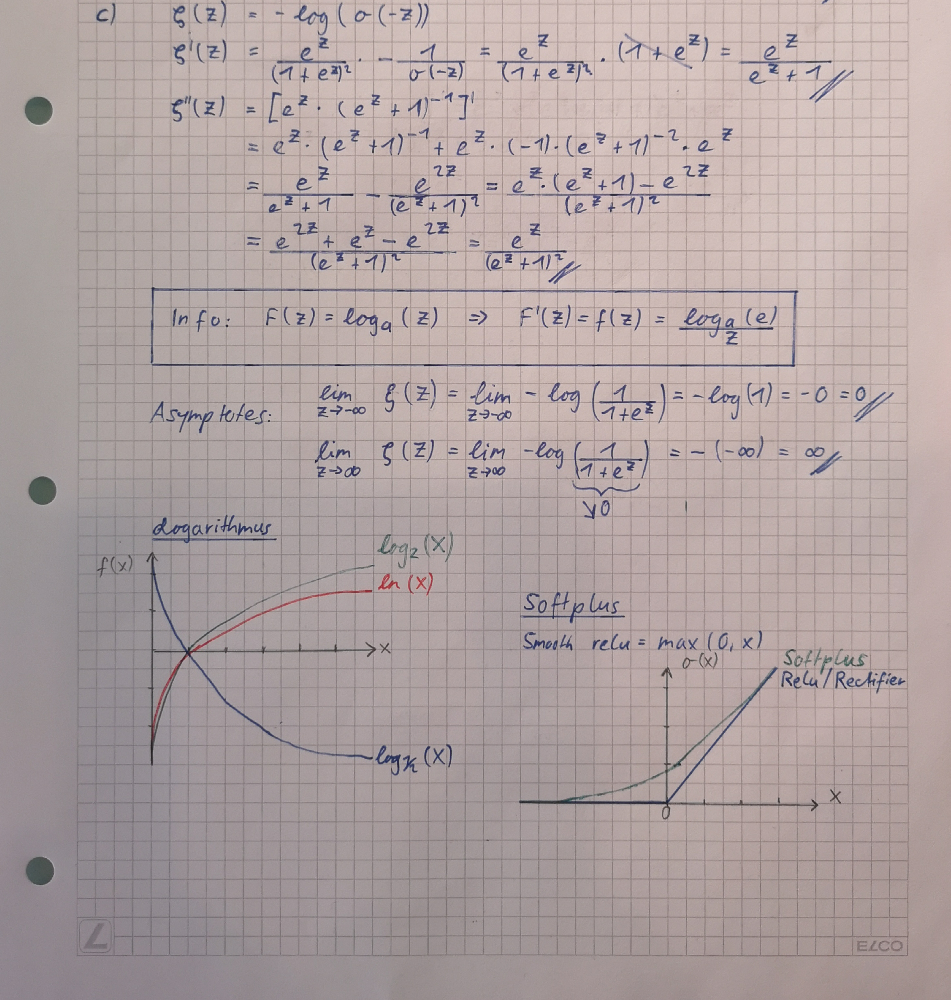

In [3]:
im_disp = im.crop((0,980,width,height))

display(im_disp)

In [4]:
def sigmoid(z):
  return 1/(1+np.exp(-z))
  
def softplus(z):
  return -np.log(sigmoid(-z))

def rectifier(z):
  return np.maximum(0,z)

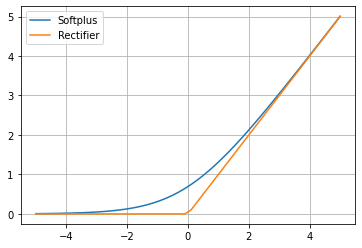

In [5]:
import numpy as np
import matplotlib.pyplot as plt

x = np.linspace(-5, 5, 50)

plt.plot(x, softplus(x))
plt.plot(x, rectifier(x))
plt.legend(['Softplus', 'Rectifier'])

plt.grid()
plt.show()

## Exercise 2 d)
Implement the sigmoid function in a Jupyter Notebook. Make it work such that you can
pass numpy arrays of arbitrary shape and the function is applied element-wise. Plot the
sigmoid function and its derivative by using matplotlib.


In [6]:
def sigmoid_prime(z):
  return np.exp(-z)/(1+np.exp(-z))**2

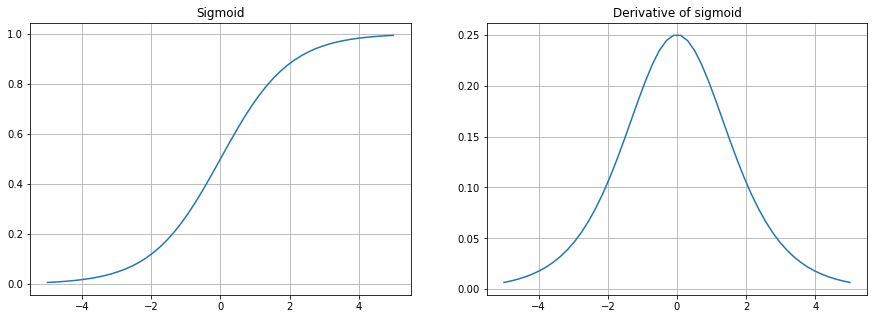

In [7]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(x, sigmoid(x))
plt.title('Sigmoid')
plt.grid()

plt.subplot(1,2,2)
plt.plot(x,sigmoid_prime(x))
plt.title('Derivative of sigmoid')
plt.grid()

## Exercise 2 e)
No exercise descripition available...

## Exercise 2 f)
Show that the function
c1(x) = (σ(x) − 1)**2
is non-convex.
Explain in which situations (initial settings) optimising c1(x) with gradient descent may
become difficult. For the explanation create a plot. Note that this exercise should give an
intuition on why mean-square error loss is less suited for classification problems.

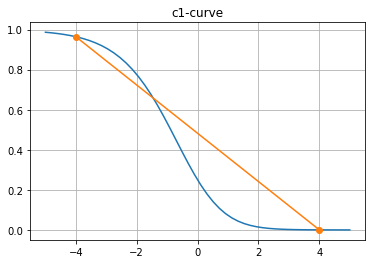

In [8]:
def c1(z):
  return (sigmoid(z)-1)**2

# c1-curve
plt.plot(x, c1(x))
plt.title('c1-curve')
plt.grid()

# straight line to proove the function c1 to be non-convex
x1 = -4
x2 = 4
p1 = [x1, c1(x1)]
p2 = [x2, c1(x2)]
plt.plot([p1[0], p2[0]], [p1[1], p2[1]], 'o-')

plt.show()

### Show that the function c1(x) = (σ(x) − 1)**2 is non-convex.
Demonstrating, that the function c1(x) is non-convex graphically is trivial. In the plot above, two points (p1 and p2) around the sattle-point (Around approximately x=-1) are connected by an orange line. If the function c1(x) would be convex, then no point of the blue c1(x) curve would be above the orange line. This is not the case, hence c1(x) is non-convex.

### Explain in which situations (initial settings) optimising c1(x) with gradient descent may become difficult.
The gradient descent algorithm xk+1=xk−λ∇f(xk) works best, if there is a significant gradient ∇f(xk) around the local point to be optimized. Regarding the function c1(x), this is the case for the range between -4 and 2. It can be observed in the figure above, that the gradient of c1(x) tends to go towards 0, if the x value gets very small (Smaller than -4) or very large (larger than 2). Hence, the stepsize of the gradient descent algorithm approaches 0 and gets (nearly) stuck. This kind of problem is called "The vanishing gradient" problem.

## Exercise 2 g)
Compute the first and second derivative of the function

c2(x) = − (y log(σ(w · x)) + (1 − y) log(1 − σ(w · x)))

with respect to w ∈ R and for given y ∈ {0, 1}. Show that c2 is convex for x != 0.


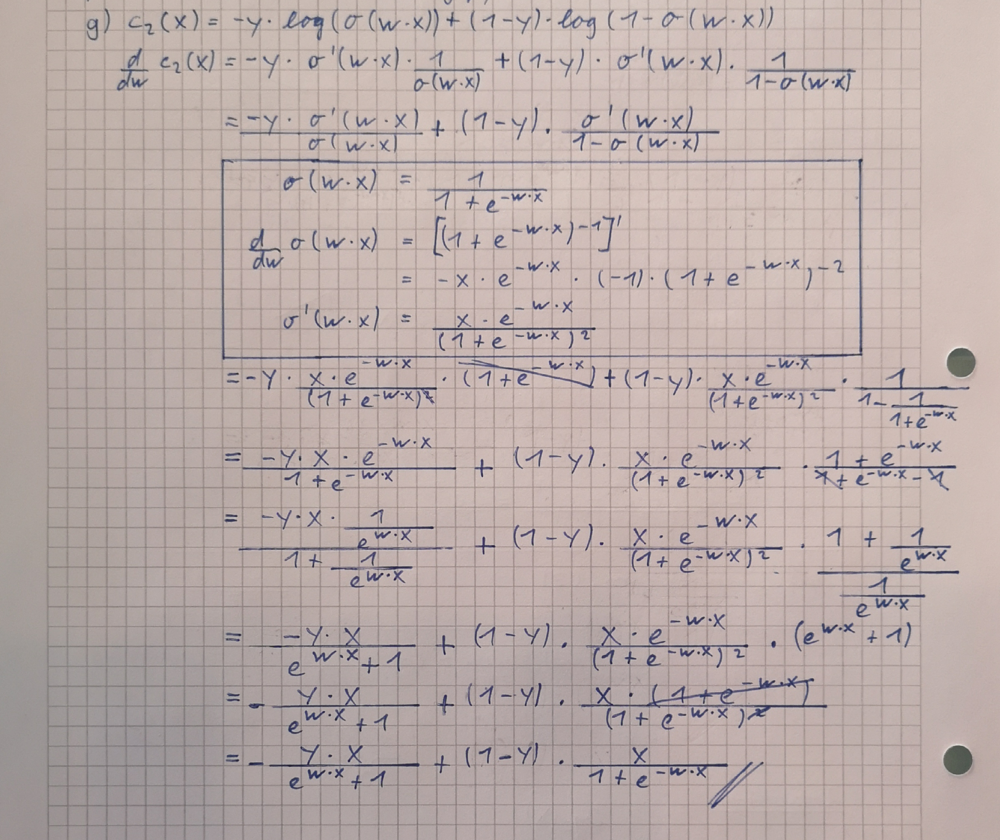

In [9]:
im = Image.open('images/exercise2_2.jpg')

width, height = im.size
im_disp = im.crop((0,400,width,2400))

display(im_disp)

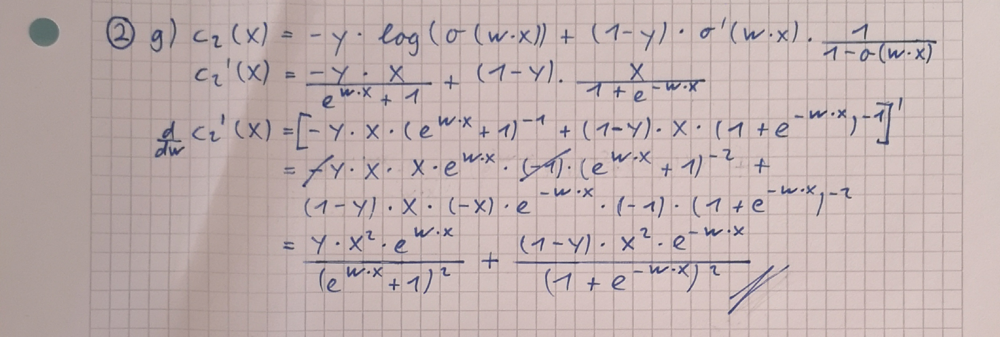

In [10]:
im = Image.open('images/exercise2_3.jpg')

width, height = im.size
im_disp = im.crop((0,220,width,1000))

display(im_disp)

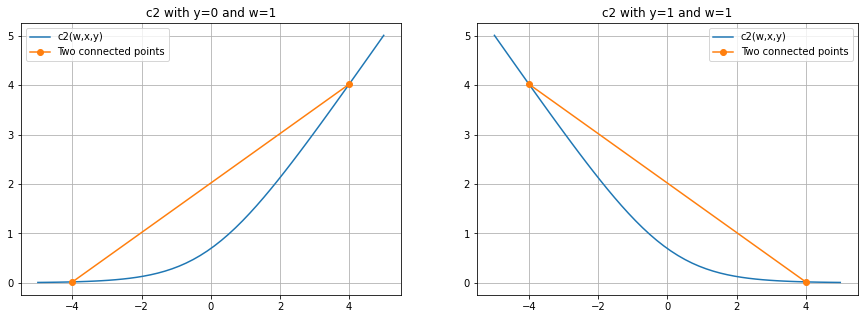

In [11]:
def c2(w,x,y):
  return -(y*np.log(sigmoid(w*x))+(1-y)*np.log(1-sigmoid(w*x)))

plt.figure(figsize=(15,5))

# c2 with y=0 and w=1 (Just a scaling factor)
plt.subplot(1,2,1)
plt.plot(x, c2(1,x,0))
plt.title('c2 with y=0 and w=1')
plt.grid()

# straight line to proove the function c2 with y=0 to be convex
x1 = -4
x2 = 4
p1 = [x1, c2(1,x1,0)]
p2 = [x2, c2(1,x2,0)]
plt.plot([p1[0], p2[0]], [p1[1], p2[1]], 'o-')
plt.legend(['c2(w,x,y)', 'Two connected points'])

# c2 with y=1 and w=1 (Just a scaling factor)
plt.subplot(1,2,2)
plt.plot(x, c2(1,x,1))
plt.title('c2 with y=1 and w=1')
plt.grid()

# straight line to proove the function c2 with y=1 to be convex
x1 = -4
x2 = 4
p1 = [x1, c2(1,x1,1)]
p2 = [x2, c2(1,x2,1)]
plt.plot([p1[0], p2[0]], [p1[1], p2[1]], 'o-')
plt.legend(['c2(w,x,y)', 'Two connected points'])

plt.show()

### Show that c2 is convex for x != 0
Given an orange line of any two connected points in the blue function c2(w,x,y), all points of c2(w,x,y) lie underneath the line. Hence, the function c2(w,x,y) is convex.